In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()
sns.set_style('darkgrid')
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score as f1
from sklearn.metrics import confusion_matrix
import scikitplot as skplt

plt.rc('figure',figsize=(18,9))
%pip install imbalanced-learn
from imblearn.over_sampling import SMOTE

In [5]:
c_data = pd.read_csv(r"C:\Users\User\Pictures\BankChurners.csv")
c_data = c_data[c_data.columns[:-2]]
c_data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [6]:
fig = make_subplots(rows=2, cols=1)

tr1 = go.Box(x=c_data['Customer_Age'], name='Age Box Plot', boxmean=True)
tr2 = go.Histogram(x=c_data['Customer_Age'], name='Age Histogram')

fig.add_trace(tr1, row=1, col=1)
fig.add_trace(tr2, row=2, col=1)

fig.update_layout(height=700, width=1200, title_text = 'Distribution of Customer Ages')
fig.show()

In [7]:
ex.pie(c_data, names='Gender', title = 'Proportion of customer Genders')

In [9]:
fig = make_subplots(rows=2, cols=1)

tr1 = go.Box(x=c_data['Dependent_count'], name='Dependent count box Plot', boxmean=True)
tr2 = go.Histogram(x=c_data['Dependent_count'], name='Dependent count Histogram')

fig.add_trace(tr1, row=1, col=1)
fig.add_trace(tr2, row=2, col=1)

fig.update_layout(height=700, width=1200, title_text = 'Distribution of Dependent count')
fig.show()

In [10]:
ex.pie(c_data,names='Education_Level',title='Propotion Of Education Levels')

In [11]:
ex.pie(c_data,names='Marital_Status',title='Propotion Of Different Marriage Statuses')

In [12]:
ex.pie(c_data,names='Income_Category',title='Propotion Of Different Income Levels')


In [13]:
ex.pie(c_data,names='Card_Category',title='Propotion Of Different Card Categories')


In [14]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Months_on_book'],name='Months on book Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Months_on_book'],name='Months on book Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of months the customer is part of the bank")
fig.show()

In [16]:
print("Kurtosis of month on book feature is :", format(c_data['Months_on_book'].kurt()) )

Kurtosis of month on book feature is : 0.40010012019986707


In [17]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Total_Relationship_Count'],name='Total no. of products Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Total_Relationship_Count'],name='Total no. of products Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of Total no. of products held by the customer")
fig.show()


In [18]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Months_Inactive_12_mon'],name='number of months inactive Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Months_Inactive_12_mon'],name='number of months inactive Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of the number of months inactive in the last 12 months")
fig.show()

In [19]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Credit_Limit'],name='Credit_Limit Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Credit_Limit'],name='Credit_Limit Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of the Credit Limit")
fig.show()

In [20]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=c_data['Total_Trans_Amt'],name='Total_Trans_Amt Box Plot',boxmean=True)
tr2=go.Histogram(x=c_data['Total_Trans_Amt'],name='Total_Trans_Amt Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of the Total Transaction Amount (Last 12 months)")
fig.show()

In [21]:
ex.pie(c_data,names='Attrition_Flag',title='Proportion of churn vs not churn customers')

In [22]:
c_data.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [24]:
c_data.Attrition_Flag = c_data.Attrition_Flag.replace({'Attrited Customer':1, 'Existing Customer':0})
c_data.Gender = c_data.Gender.replace({'F':1, 'M':0})
c_data = pd.concat([c_data, pd.get_dummies(c_data['Education_Level']).drop(columns=['Unknown'])], axis=1)
c_data = pd.concat([c_data, pd.get_dummies(c_data['Income_Category']).drop(columns=['Unknown'])], axis=1)
c_data = pd.concat([c_data, pd.get_dummies(c_data['Marital_Status']).drop(columns=['Unknown'])], axis=1)
c_data = pd.concat([c_data, pd.get_dummies(c_data['Card_Category']).drop(columns=['Platinum'])], axis=1)
c_data.drop(columns = ['Education_Level','Income_Category','Marital_Status','Card_Category','CLIENTNUM'],inplace=True)

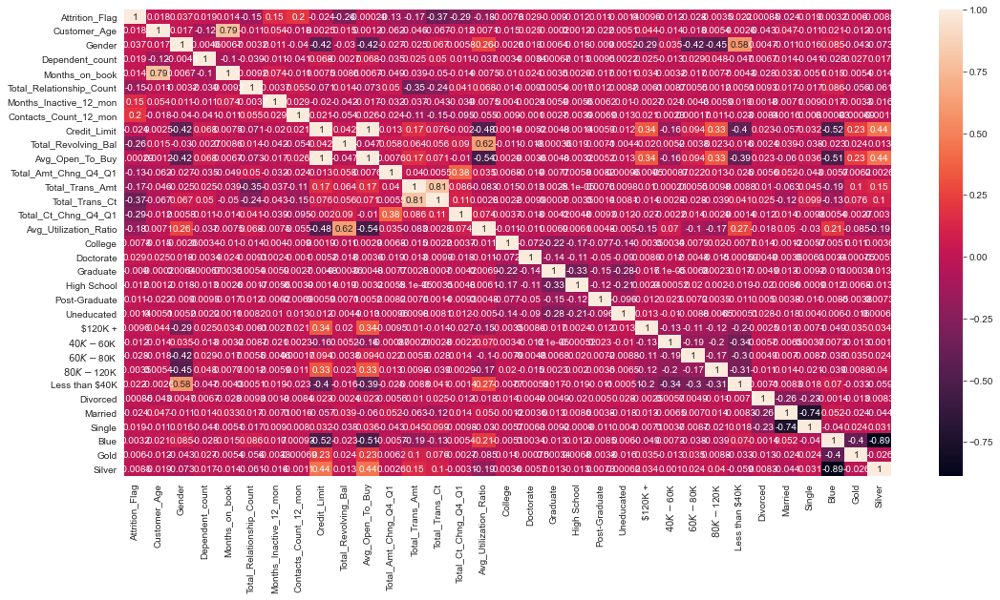

In [25]:
sns.heatmap(c_data.corr('pearson'), annot=True)

In [28]:
oversample = SMOTE()
X, y = oversample.fit_resample(c_data[c_data.columns[1:]], c_data[c_data.columns[0]])
usampled_df = X.assign(Churn=y)

In [29]:
ohe_data = unsampled_df[unsampled_df.columns[15:-1]].copy()

usampled_df = usampled_df.drop(columns=usampled_df.columns[15:-1])

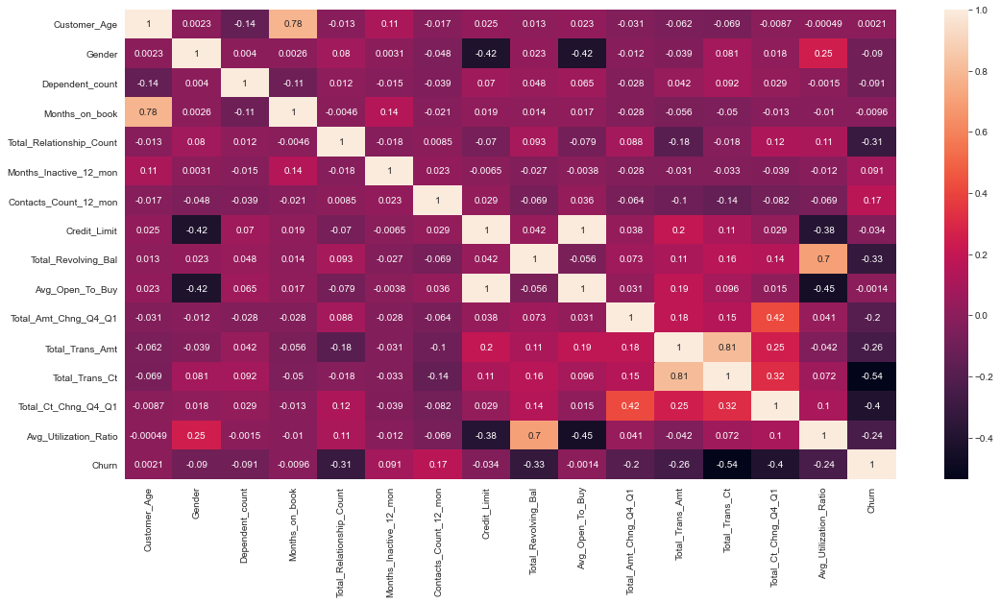

In [30]:
sns.heatmap(usampled_df.corr('pearson'),annot=True)

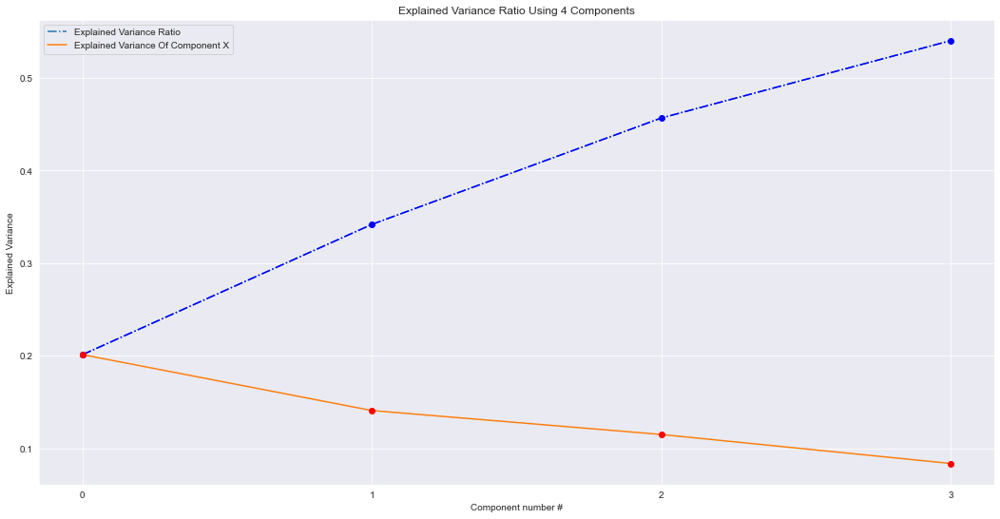

In [31]:
N_COMPONENTS = 4

pca_model = PCA(n_components = N_COMPONENTS)

pc_matrix = pca_model.fit_transform(ohe_data)

evr = pca_model.explained_variance_ratio_
cumsum_evr = np.cumsum(evr)


ax = sns.lineplot(x=np.arange(0,len(cumsum_evr)),y=cumsum_evr,label='Explained Variance Ratio')
ax.lines[0].set_linestyle('-.')
ax.set_title('Explained Variance Ratio Using {} Components'.format(N_COMPONENTS))
ax.plot(np.arange(0,len(cumsum_evr)),cumsum_evr,'bo')
ax = sns.lineplot(x=np.arange(0,len(cumsum_evr)),y=evr,label='Explained Variance Of Component X')
ax.plot(np.arange(0,len(evr)),evr,'ro')
ax.lines[1].set_linestyle('-.')
ax.set_xticks([i for i in range(0,len(cumsum_evr))])
ax.set_xlabel('Component number #')
ax.set_ylabel('Explained Variance')
plt.show()

In [32]:
usampled_df_with_pcs = pd.concat([usampled_df, pd.DataFrame(pc_matrix, columns=['PC-{}'.format(i) for i in range(0, N_COMPONENTS)])], axis=1)
usampled_df_with_pcs

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Churn,PC-0,PC-1,PC-2,PC-3
0,45,0,3,39,5,1,3,12691.000000,777,11914.000000,1.335000,1144,42,1.625000,0.061000,0,-0.695880,-0.376903,-0.357282,0.723020
1,49,1,5,44,6,1,2,8256.000000,864,7392.000000,1.541000,1291,33,3.714000,0.105000,0,0.715009,0.879634,0.694302,0.153734
2,51,0,3,36,4,1,0,3418.000000,0,3418.000000,2.594000,1887,20,2.333000,0.000000,0,-0.724653,-0.220331,0.855410,0.114981
3,40,1,4,34,3,4,1,3313.000000,2517,796.000000,1.405000,1171,20,2.333000,0.760000,0,0.064451,0.624961,-0.630334,0.157477
4,40,0,3,21,5,1,0,4716.000000,0,4716.000000,2.175000,816,28,2.500000,0.000000,0,-0.685054,-0.354778,-0.198128,0.113144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16995,50,1,1,43,3,2,3,7040.576564,0,7040.576564,0.694720,2334,38,0.333969,0.000000,1,0.072082,0.656968,-0.336980,-0.434432
16996,43,1,2,30,2,2,2,1786.852816,1185,601.516488,0.458979,1978,52,0.651745,0.662639,1,0.030438,-0.093446,0.714633,-0.433887
16997,45,0,2,32,2,2,2,4669.527735,2444,2224.709647,0.901741,8879,64,0.663452,0.523511,1,0.072082,0.656968,-0.336980,-0.434432
16998,46,0,0,40,2,3,2,34516.000000,2342,32173.864017,0.495693,1737,38,0.429507,0.067705,1,0.775930,-0.315353,-0.045062,0.009436


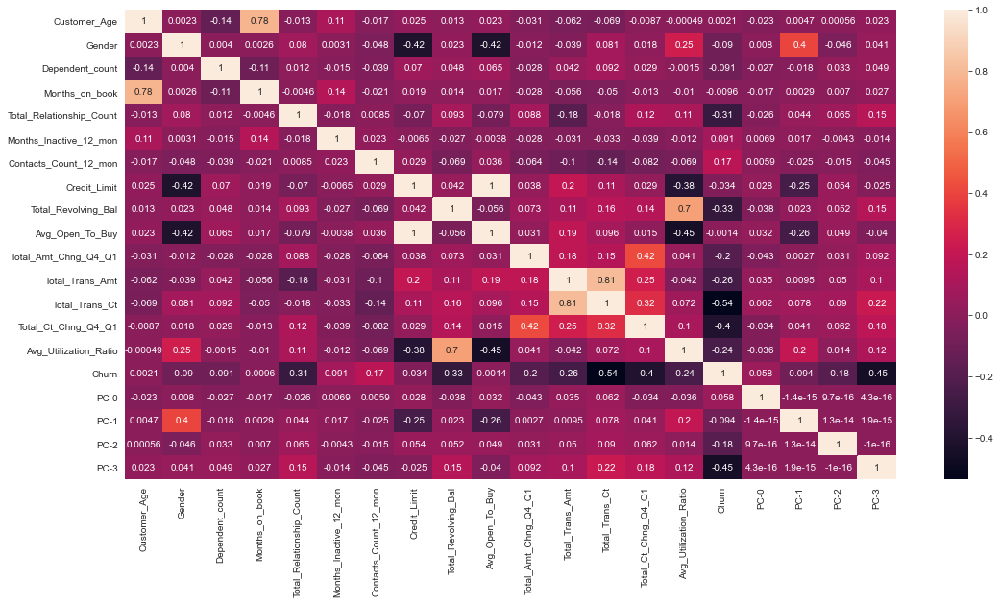

In [33]:
sns.heatmap(usampled_df_with_pcs.corr('pearson'),annot=True)

In [34]:
X_features = ['Total_Trans_Ct','PC-3','PC-1','PC-0','PC-2','Total_Ct_Chng_Q4_Q1','Total_Relationship_Count']

X = usampled_df_with_pcs[X_features]
y = usampled_df_with_pcs['Churn']

In [35]:
train_x,test_x,train_y,test_y = train_test_split(X,y,random_state=42)

In [36]:
rf_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",RandomForestClassifier(random_state=42)) ])
ada_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",AdaBoostClassifier(random_state=42,learning_rate=0.7)) ])
svm_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",SVC(random_state=42,kernel='rbf')) ])


f1_cross_val_scores = cross_val_score(rf_pipe,train_x,train_y,cv=5,scoring='f1')
ada_f1_cross_val_scores=cross_val_score(ada_pipe,train_x,train_y,cv=5,scoring='f1')
svm_f1_cross_val_scores=cross_val_score(svm_pipe,train_x,train_y,cv=5,scoring='f1')


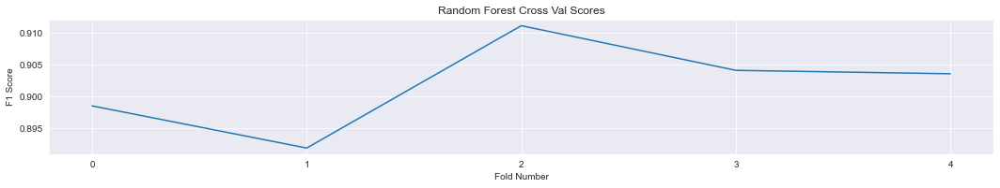

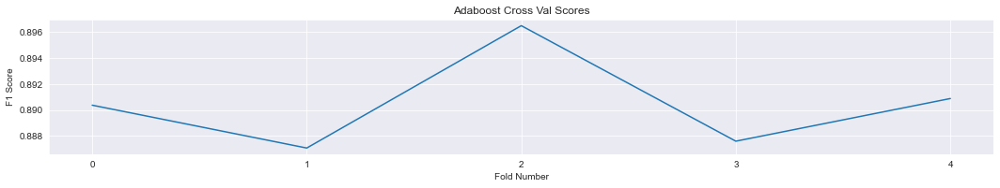

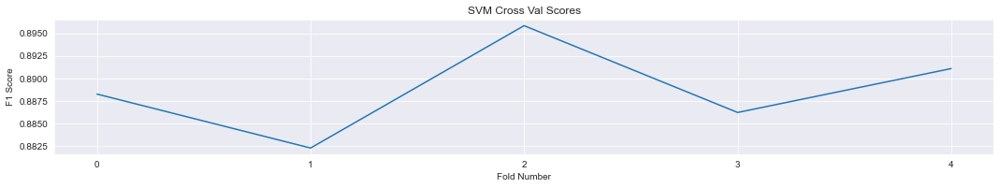

In [37]:
plt.subplot(3,1,1)
ax = sns.lineplot(x=range(0,len(f1_cross_val_scores)),y=f1_cross_val_scores)
ax.set_title('Random Forest Cross Val Scores')
ax.set_xticks([i for i in range(0,len(f1_cross_val_scores))])
ax.set_xlabel('Fold Number')
ax.set_ylabel('F1 Score')
plt.show()
plt.subplot(3,1,2)
ax = sns.lineplot(x=range(0,len(ada_f1_cross_val_scores)),y=ada_f1_cross_val_scores)
ax.set_title('Adaboost Cross Val Scores')
ax.set_xticks([i for i in range(0,len(ada_f1_cross_val_scores))])
ax.set_xlabel('Fold Number')
ax.set_ylabel('F1 Score')
plt.show()
plt.subplot(3,1,3)
ax = sns.lineplot(x=range(0,len(svm_f1_cross_val_scores)),y=svm_f1_cross_val_scores)
ax.set_title('SVM Cross Val Scores')
ax.set_xticks([i for i in range(0,len(svm_f1_cross_val_scores))])
ax.set_xlabel('Fold Number')
ax.set_ylabel('F1 Score')
plt.show()

In [38]:
rf_pipe.fit(train_x,train_y)
rf_prediction = rf_pipe.predict(test_x)

ada_pipe.fit(train_x,train_y)
ada_prediction = ada_pipe.predict(test_x)

svm_pipe.fit(train_x,train_y)
svm_prediction = svm_pipe.predict(test_x)

print('F1 Score of Random Forest Model On Test Set - {}'.format(f1(rf_prediction,test_y)))
print('F1 Score of AdaBoost Model On Test Set - {}'.format(f1(ada_prediction,test_y)))
print('F1 Score of SVM Model On Test Set - {}'.format(f1(svm_prediction,test_y)))

F1 Score of Random Forest Model On Test Set - 0.9003354096789651
F1 Score of AdaBoost Model On Test Set - 0.8903073286052009
F1 Score of SVM Model On Test Set - 0.8888351860802319


In [39]:
ohe_data =c_data[c_data.columns[16:]].copy()
pc_matrix = pca_model.fit_transform(ohe_data)
original_df_with_pcs = pd.concat([c_data,pd.DataFrame(pc_matrix,columns=['PC-{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)

unsampled_data_prediction_RF = rf_pipe.predict(original_df_with_pcs[X_features])
unsampled_data_prediction_ADA = ada_pipe.predict(original_df_with_pcs[X_features])
unsampled_data_prediction_SVM = svm_pipe.predict(original_df_with_pcs[X_features])

In [40]:
print('F1 Score of Random Forest Model On Original Data (Before Upsampling) - {}'.format(f1(unsampled_data_prediction_RF,original_df_with_pcs['Attrition_Flag'])))
print('F1 Score of AdaBoost Model On Original Data (Before Upsampling) - {}'.format(f1(unsampled_data_prediction_ADA,original_df_with_pcs['Attrition_Flag'])))
print('F1 Score of SVM Model On Original Data (Before Upsampling) - {}'.format(f1(unsampled_data_prediction_SVM,original_df_with_pcs['Attrition_Flag'])))

F1 Score of Random Forest Model On Original Data (Before Upsampling) - 0.6324878575283325
F1 Score of AdaBoost Model On Original Data (Before Upsampling) - 0.51508868924211
F1 Score of SVM Model On Original Data (Before Upsampling) - 0.547715262667081


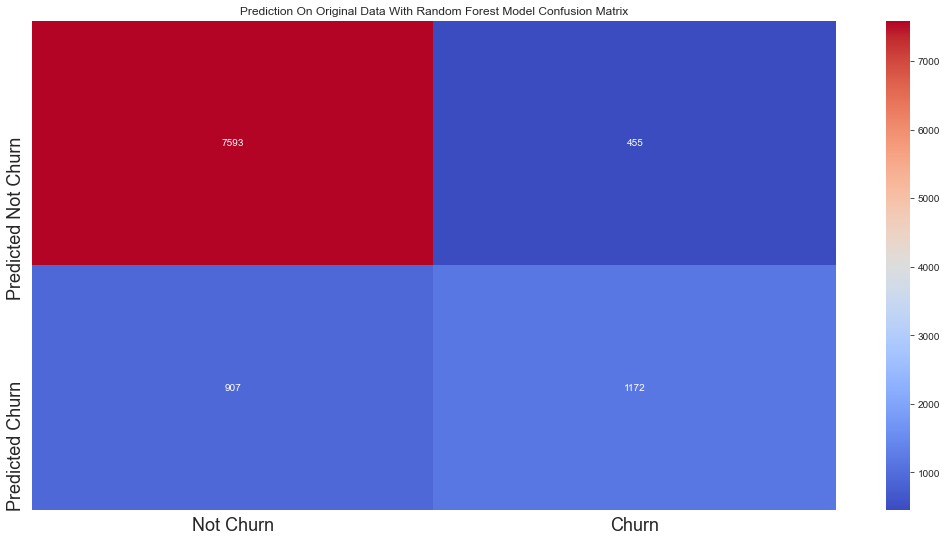

In [41]:
ax = sns.heatmap(confusion_matrix(unsampled_data_prediction_RF,original_df_with_pcs['Attrition_Flag']),annot=True,cmap='coolwarm',fmt='d')
ax.set_title('Prediction On Original Data With Random Forest Model Confusion Matrix')
ax.set_xticklabels(['Not Churn','Churn'],fontsize=18)
ax.set_yticklabels(['Predicted Not Churn','Predicted Churn'],fontsize=18)

plt.show()

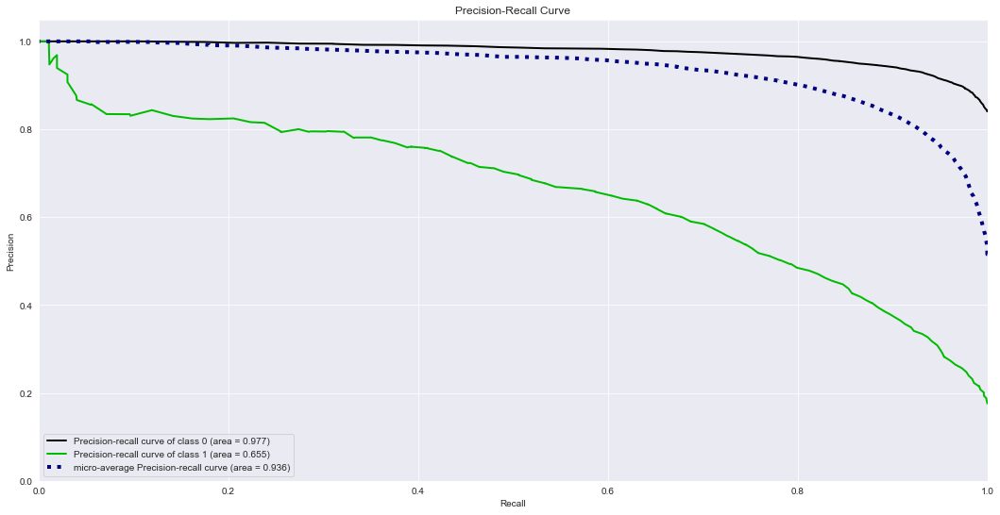

In [42]:
unsampled_data_prediction_RF = rf_pipe.predict_proba(original_df_with_pcs[X_features])
skplt.metrics.plot_precision_recall(original_df_with_pcs['Attrition_Flag'], unsampled_data_prediction_RF)